In [1]:
from tools import analytics

**What To Look At**
- Highlight commonalities
- Limitations
- Intereseting samples (both images and labels)

### Load, process and vizualize training samples and labels

In [14]:
CFG_PATH = "neuralvision/configs/tdt4265_tfms.py"
SET_TYPE = "train"
BATCH_SIZE = 1 

cfg_file = analytics.get_config(CFG_PATH)
cfg, dataset, gpu_tfms = analytics.prepare_dataset(cfg_file, dataset_type=SET_TYPE, batch_size=BATCH_SIZE)
img_mean, img_std = analytics.calculate_mean_std(cfg)

print(f"Using transforms: ")
[print(f["_target_"]) for f in cfg.data_train.dataset.transform.transforms]

Saving SSD outputs to: outputs/
Using transforms: 
<class 'neuralvision.transforms.transform.RandomSampleCrop'>
<class 'neuralvision.transforms.transform.ToTensor'>
<class 'neuralvision.transforms.transform.RandomHorizontalFlip'>
<class 'neuralvision.transforms.transform.Resize'>


[None, None, None, None]

In [5]:
metadata = analytics.load_annotation_file(cfg, SET_TYPE)
annotations = analytics.process_annotations(metadata["annotations"])
catagories = analytics.process_categories(metadata["categories"])

In [6]:
# Replace category_id with category_name from catagories
annotations["category_id"] = annotations["category_id"].map(catagories.set_index("id")["name"])

In [7]:
annotations.head()

,id,image_id,category_id,area,xmin,ymin,xmax,ymax,width,height
0,1,1,car,280.2960,725.93,63.64,746.33,77.38,20.40,13.74
1,2,1,person,248.6808,351.26,81.08,359.20,112.40,7.94,31.32
2,3,1,scooter,171.6447,187.57,81.25,194.84,104.86,7.27,23.61
3,4,1,scooter,144.4352,431.30,87.54,438.58,107.38,7.28,19.84
4,5,1,car,1454.7000,107.80,78.10,145.10,117.10,37.30,39.00


In [8]:
unique_catagories = annotations["category_id"].unique().tolist()

metrics_frame = analytics.get_category_metrics(annotations["category_id"], decimals=2)
metrics_frame

,category,total,in %
0,car,9563,52.29
1,person,4910,26.85
2,rider,1588,8.68
3,bicycle,1043,5.70
4,scooter,615,3.36
5,bus,445,2.43
6,truck,123,0.67


### Statistics of Bounding Boxes

In [9]:
annotations.drop(columns=["id", "image_id", "category_id"]).describe().round(3)

,area,xmin,ymin,xmax,ymax,width,height
count,18287.000,18287.000,18287.000,18287.000,18287.000,18287.000,18287.000
mean,786.196,411.263,72.159,431.351,98.939,20.088,26.780
std,2311.536,295.438,11.617,296.342,19.066,26.371,16.645
min,9.990,0.000,0.000,3.200,60.100,2.010,3.320
25%,121.077,118.700,66.045,143.230,84.070,6.930,13.910
50%,261.116,457.570,72.060,475.260,94.030,12.710,22.310
75%,675.330,556.535,77.990,577.260,116.385,22.030,36.285
max,51046.400,1020.090,121.040,1024.000,128.000,398.800,128.000


### Statistics of Car Bounding Boxes

In [10]:
cars = annotations[annotations["category_id"] == "car"]
cars.drop(columns=["id", "image_id", "category_id"]).describe().round(3)

,area,xmin,ymin,xmax,ymax,width,height
count,9563.000,9563.000,9563.000,9563.000,9563.000,9563.000,9563.000
mean,996.868,369.640,73.523,398.045,99.579,28.405,26.056
std,1586.448,294.579,10.256,297.023,20.254,26.552,15.649
min,9.990,0.000,1.550,3.200,61.400,2.700,3.320
25%,189.858,48.715,67.225,74.245,83.010,13.365,13.060
50%,411.817,442.300,72.750,472.170,93.600,19.670,21.760
75%,1281.372,511.505,78.320,537.300,126.655,32.870,37.290
max,32424.309,1020.090,121.040,1024.000,128.000,256.420,126.450


### Statistics of Bus Bounding Boxes

In [11]:
cars = annotations[annotations["category_id"] == "bus"]
cars.drop(columns=["id", "image_id", "category_id"]).describe().round(3)

,area,xmin,ymin,xmax,ymax,width,height
count,445.000,445.000,445.000,445.000,445.000,445.000,445.000
mean,4419.784,173.309,45.814,218.849,84.496,45.540,38.683
std,10217.193,270.986,17.349,327.112,24.374,78.254,39.787
min,21.735,2.500,0.000,6.540,60.100,4.040,5.380
25%,120.980,10.840,49.590,19.720,66.390,8.890,13.480
50%,265.325,21.050,52.330,37.110,74.150,14.130,18.990
75%,1032.712,534.470,54.170,602.310,92.340,30.290,35.790
max,51046.400,1014.690,64.230,1024.000,128.000,398.800,128.000


### Statistics of Average Bounding Boxes 

In [12]:
box_metrics = analytics.get_avg_box_metrics(annotations, unique_catagories=unique_catagories)
box_metrics

,dimension,car,person,scooter,bicycle,rider,bus,truck
0,area,740.36,190.92,278.52,282.77,242.52,1761.49,3075.34
1,aspect,14:13,7:26,9:29,13:20,2:7,45:38,28:27
2,width,28.41,7.14,9.4,13.7,8.45,45.54,56.15
3,height,26.06,26.74,29.63,20.64,28.7,38.68,54.77


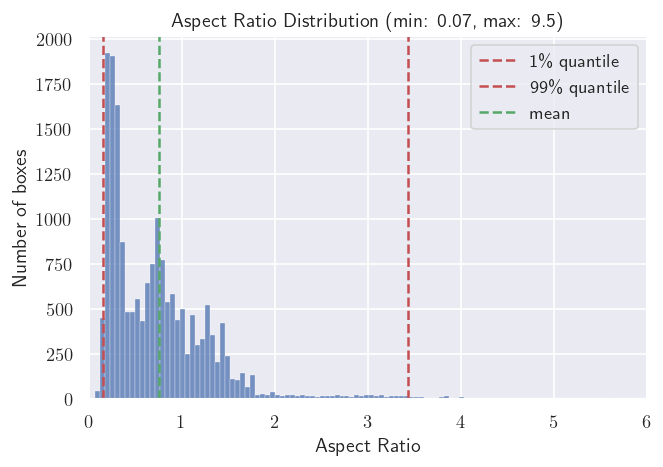

In [13]:
analytics.view_aspect_ratio_distribution(annotations)

### STATISTICAL Observations based on initial intuition

**Catagories**
- We can see that we have quite skewed distribution of catagories.
- There are considerly more cars ($9563$ in this set) then anything else, above $50 \%$ of the total dataset.
- Looking at the CAR boxes, we can see that the average width and height in pixels of the bounding boxes are are $28.405$ and $26.056$ respectively.   
  This would then indicate that if an image is $1024 x 128$ in width and heigth, then the relative box width and height would be $2.8 \%$ and $20.4 \%$. (??).   
  This indicates that we're looking at a relatively small bounding boxes in spesific areas of the image and not soo much big objects.   
  (See following sections for actual visualizations).


**Boxes**
- Give that we mostly have cars (above $50 \%$), then we could expect best performance on boxes with close to quadratic or rectangular shapes with some what even distribution of aspect ratios.
- Similary for persons, which have a entierly different shape of boxes compared to cars. Here we're facing tall and slim rectangular boxes.
- On the other hand of the scale, the largets feasible rectangular shapes are poorly represented in the dataset and could (?) naturally therefore be thought of as harder objects to detect.
- The same could be said for busses, as these two (respepectfully at $0.67 \%$ and $2.43 \%$ of the dataset) are close to represetning only $3 \%$ of the dataset.
- Comparing the dimentions of the different bounding boxes for each catagory, we can see that we all classes have different area size. We can also note similar size features for person, rider, bicycle and scooter as these in real-life are objects with intersecting each-other (e.g *a person can be riding a bicycle => rider*, *a person could be on a scooter => rider* etc..) 
- Taking catagory frequency and aspect ratio dimentions info consideration,
  we can see a quite varying distribution. This further indicates that the dataset is not very homogeneous.
  The average aspect ratios shows that:
    - aspect ratios &#8773; 1 indicates similarities to square shapes (cars, busses, trucks)
    - aspect ratios &#60; 1 indicates similarities to tall and narrow shapes (persons, riders, bicycles, scooters)
    - aspect ratios &#62; 1 indicates similarities to wide and short shapes (non-observered)

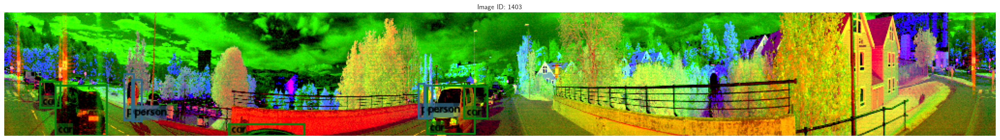

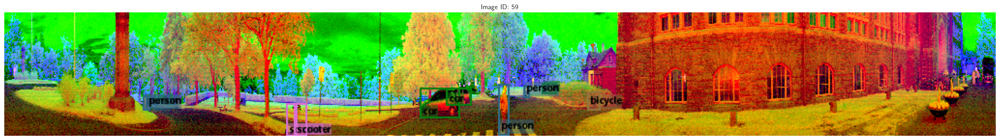

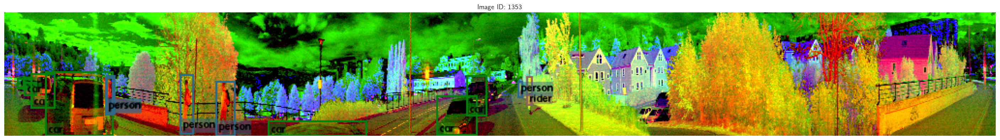

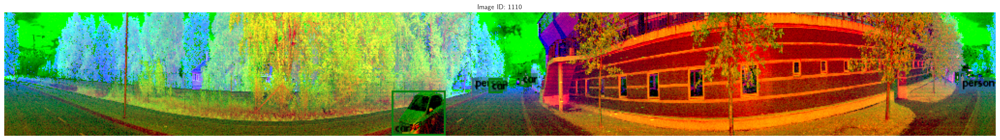

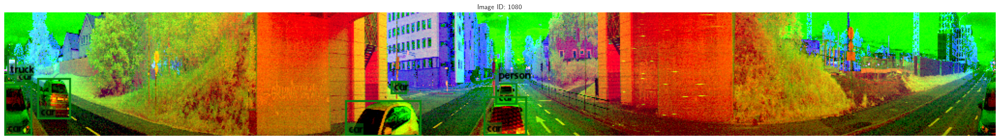

In [14]:
MAX_SAMPLES = 5


for idx, sample in enumerate(iter(dataset)):
    image, boxes = analytics.preprocess_sample(
        sample,
        gpu_tfms,
        img_std,
        img_mean
    )
    analytics.visualize_sample(
        img_id = sample["image_id"][0],
        image = image,
        boxes = boxes,
        labels = sample["labels"][0].cpu().numpy().tolist(),
        lblmap = cfg.label_map
    )  

    if (idx+1) >= MAX_SAMPLES:
        break

### VISUAL Observation based on initial intuition

- Images are of dimention $1024 x 128$, thereby quite wide with an aspect ratio of 
- Noted a case where the annotation box of a person is overlapping a car (?)
- The shape of the bounding boxes varies greatly, as we've noted in the statisical observations. The following shapes have been observed:
    - Most of the bounding boxes are rectangular.
    - Some of the bounding boxes are quite tall, but short in width.
    - Some of the bounding boxes are almost square, but not quite.
    - The sizes varies greatly, and can be everything from a few pixels to a few hundred pixels.    
      (e.g. could have a picture with a huge bounding box of a bus and a tiny slim box of a person or a bicyle for that matter.)
- Based on previous stastistics of the bounding boxes metrics, we can confirm what we observered about the dataset.
- We can for instance see that the aspect ratio of the car boxes are quite close to 1, and the above 1 for persons which have taller but narrow boxes. 
- Certain boxes are occluded behind other objects, which makes it hard to see. 

#### Remarks
- Running the analysis for both training and validation set shows that the dataset is quite skewed in terms of the number of bounding boxes per catagory.
- The training set has all catagories cars, persons, rider, bicycle, scooter, bus and truck (in decsending order). 
- The validation set has only the catagories persons, car, rider and bus (in descending order).

## VISUAL Observations by looking through all images (finding weird annotations)

**TRAINING SET**    
(img_id, cause of weirdness)
- 10, person is behind three
- 50-97, car is annotated through the car
- 121, empty car annotation
- 138-151, a lot of scooter annotations missing?
- 303-403, missing a lot of bicycles?
- 428-440, missing a lot of bicycles?
- 636-684, missing a lot of bicycles?
- 763-768, rider+bicycle is behind passing big black car?
- 801-804, rider+bicycle+person are behind threes?
- 824-830, car to the right is occluded by object
- 905-910, car in right lane is occluded by another car
- 994-999, person/rider (missing bicycle) is behind car in right lane
- 1008-1018, car is occluded by another by big truck
- 1122-1124, person on sidewalk is occluded by a passing car
- 1205-1242, on right side, walking person, rider and car is kind of occluded with eachother
- 1223-1228, rider on left side is occluded by passing car
- 1243-1272, walking person on right side is partially occluded by car
- 1275-1293, walking person on right side is partially occluded by car
- 1308-1311, cars in line on left side occluded big big car behind
- 1343-1353, walking persons on sidewalk occluded by passing cars
- 1384-1399, walking persons on sidewalk occluded by passing cars

**VALIDATION SET**    
(img_id, cause of weirdness)
- 13-18, right side, person on sidewalk occluded by passing car
- 48-71, isnt bicycle also to be annotated whe annotating a rider?
- 89-91, left side, person on sidewalk occluded by passing car
- 72-101, are persons in mirrors also persons?
- 102-107, left side, car/persons occluded by passing bus
- 114, left side, car/persons occluded by passing bus
- 118-126
    - persons occluded by passing car
    - persons occluded by passing bus
    - parked cars occluded by passing car
    - bus occluded by anoter bus passing bus
- 129-131, left side, persons on sidewalk occluded by passing car
- 151-153, left side, persons on sidewalk occluded by passing car
- 159-162, left center, persons on sidewalk occluded by passing car
- 171-175, left center, persons on sidewalk occluded by passing car
- 180-182, center, persons on sidewalk occluded by passing car
- 187-189, left side, persons on sidewalk occluded by passing car
- 181-189, parked bus occluded by passing bus
- 202-244, left side: parked scooters missing annotations
- 226-257, right side: parked bicycles / scooters missing annotations
- 213-263, both sides: standing people with occational occlusions
- 290-301, center: parked scooters missing annotations

## Keeps In Mind:

- Object detection is customarily considered to be much harder than image classification, particularly because of these five challenges:
    - dual priorities
    - speed
    - multiple scales
    - limited data
    - class imbalance

## Evaluation of BasicModel

In [15]:
scalarfile = "outputs/configs/tdt4265/logs/scalars.json"

mapframe = analytics.convert_scalar_to_metrics_map(scalarfile)
lossframe = analytics.convert_scalar_to_metrics_loss(scalarfile)

In [16]:
mapframe.head(2)

,metrics/mAP,metrics/mAP@0.5,metrics/mAP@0.75,metrics/mAP_small,metrics/mAP_medium,metrics/mAP_large,metrics/average_recall@1,metrics/average_recall@10,metrics/average_recall@100,metrics/average_recall@100_small,metrics/average_recall@100_medium,metrics/average_recall@100_large,metrics/AP_car,metrics/AP_bus,metrics/AP_person,metrics/AP_rider,global_step
0,1.491977e-07,9.328822e-07,0.000000,0.0,3.600985e-07,0.000000,0.0,0.000000,0.000261,0.0,0.000704,0.000000,5.967909e-07,0.0,0.0,0.0,50
1,2.214783e-04,6.651679e-04,0.000002,0.0,1.732673e-03,0.001161,0.0,0.000835,0.014596,0.0,0.001407,0.080498,8.859132e-04,0.0,0.0,0.0,100


In [17]:
mapframe.tail(2)

,metrics/mAP,metrics/mAP@0.5,metrics/mAP@0.75,metrics/mAP_small,metrics/mAP_medium,metrics/mAP_large,metrics/average_recall@1,metrics/average_recall@10,metrics/average_recall@100,metrics/average_recall@100_small,metrics/average_recall@100_medium,metrics/average_recall@100_large,metrics/AP_car,metrics/AP_bus,metrics/AP_person,metrics/AP_rider,global_step
45,0.043393,0.120255,0.020107,0.012696,0.043204,0.125983,0.017591,0.060362,0.060518,0.019203,0.072742,0.149549,0.172737,0.00000,0.000836,0.0,2450
46,0.049539,0.125152,0.019180,0.011245,0.057242,0.131523,0.019073,0.062531,0.062531,0.016078,0.079346,0.150721,0.196566,0.00099,0.000602,0.0,2500


In [18]:
lossframe.head(2)

,loss/regression_loss,loss/classification_loss,loss/total_loss,global_step
0,3.307081,9.266934,12.574016,0
1,3.255065,8.809639,12.064705,20


In [19]:
lossframe.tail(2)

,loss/regression_loss,loss/classification_loss,loss/total_loss,global_step
123,0.601741,1.309818,1.911559,2460
124,0.577966,1.160326,1.738292,2480


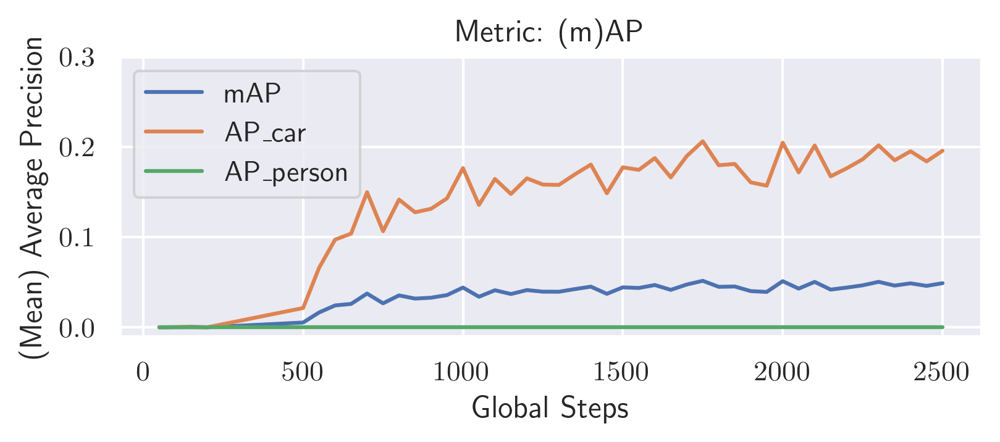

In [17]:
axis_cfg = {"x": None, "y": (-0.01, 0.3)}
metric_to_show = ["metrics/mAP", "metrics/AP_car", "metrics/AP_person"]
analytics.vizualize_metrics(mapframe, metric_to_show, axis_cfg)

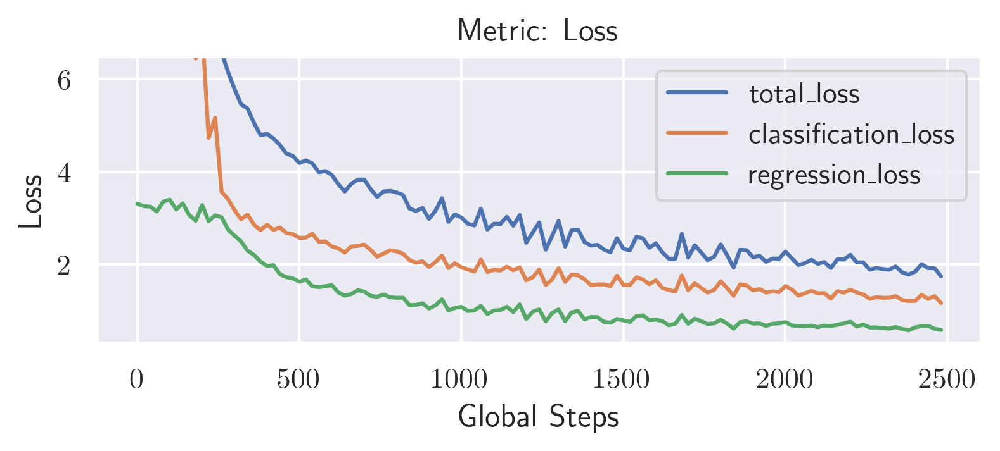

In [21]:
axis_cfg = {"x": None, "y": (0.3, 6.5)}
metric_to_show = ["loss/total_loss", "loss/classification_loss", "loss/regression_loss"]
analytics.vizualize_loss(lossframe, metric_to_show, axis_cfg)

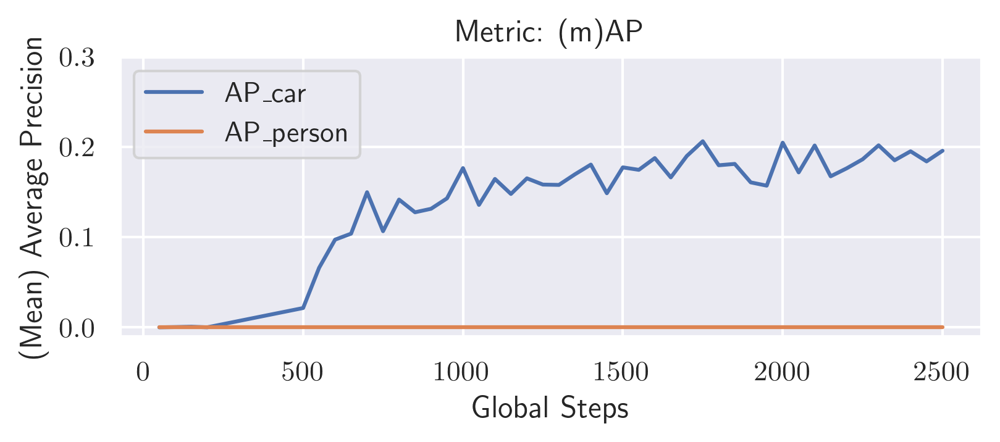

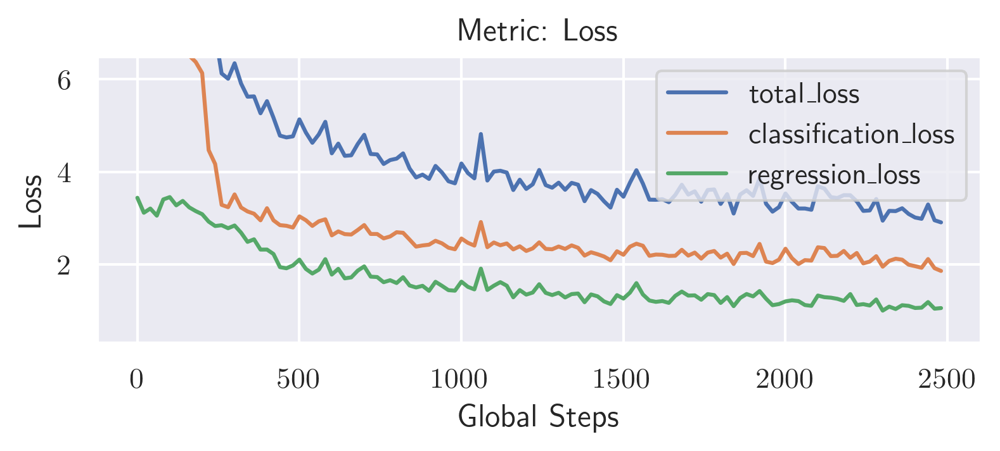

In [15]:
scalarfile = "outputs/configs/tdt4265_tfms/logs/scalars.json"

mapframe = analytics.convert_scalar_to_metrics_map(scalarfile)
lossframe = analytics.convert_scalar_to_metrics_loss(scalarfile)

axis_cfg = {"x": None, "y": (-0.01, 0.3)}
metric_to_show = ["metrics/AP_car", "metrics/AP_person"]
analytics.vizualize_metrics(mapframe, metric_to_show, axis_cfg)

axis_cfg = {"x": None, "y": (0.3, 6.5)}
metric_to_show = ["loss/total_loss", "loss/classification_loss", "loss/regression_loss"]
analytics.vizualize_loss(lossframe, metric_to_show, axis_cfg)